In [2]:
from pyreadstat import read_sav

# Just try loading one or two personality variables from DS0001
cols = ["B1SAGREE", "B1SEXTRA", "B1SNEURO"]
df_test, meta = read_sav("DS0001/04652-0001-Data.sav", usecols=cols)

print(df_test.head())


   B1SAGREE  B1SEXTRA  B1SNEURO
0       2.6       2.8      2.25
1       3.4       2.6      2.00
2       3.2       3.6      1.25
3       NaN       NaN       NaN
4       3.8       4.0      2.00


In [20]:
import pyreadstat
import pandas as pd
from sklearn.preprocessing import StandardScaler
import umap
import matplotlib.pyplot as plt
import numpy as np
import math


# Path to your .sav file
sav_path = "DS0001/04652-0001-Data.sav" 
# Selected variables and their descriptions
midus_vars = {
    #"M2ID": "MIDUS 2 ID number",
    "B1PRAGE_2019": "age",
    "B1PRSEX": "Male:1 Female:2",
    "B1PB1": "Highest level of education completed",
    #"B1PB19": "Marital status currently",
    "B1PB3A": "Currently working",
    "B1PA1": "Physical health self-evaluated",
    "B1PA2": "Mental/emotional health self-evaluated",
    #"B1PA6D": "History of other neurological disorder",
    #"B1SA11Y": "Neurological disorder ever (12 months)",
    #"B1SA11U": "Alcohol/drug problem ever (12 months)",
    #"B1SA1": "Current health rating",
    "B1SA11T": "Anxiety/depression past year",
    "B1SA11V": "Migraines past year",
    "B1SA11W": "Chronic sleep problems past year",
    "B1SG1": "Financial situation rating",
    "B1SG6": "Money meets needs",
    "B1SJ1": "Contact with family",
    "B1SJ2A": "Family cares about you",
    "B1SJ4A": "Friends care about you",
    "B1SL1": "Marriage/relationship rating",
    "B1SM1": "Sex life rating",
    "B1SQ1": "Overall life rating",
    "B1PG1": "Satisfied with life at present",
    #"B1SQ6": "How is your day"
}

# Load only the selected columns
columns_to_load = list(midus_vars.keys())
df, meta = pyreadstat.read_sav(sav_path, usecols=columns_to_load)

# Replace known non-response codes with NaN
non_response_codes = [-1, -2, -3, -7, 9999]
df.replace(non_response_codes, pd.NA, inplace=True)
df.dropna(inplace=True)


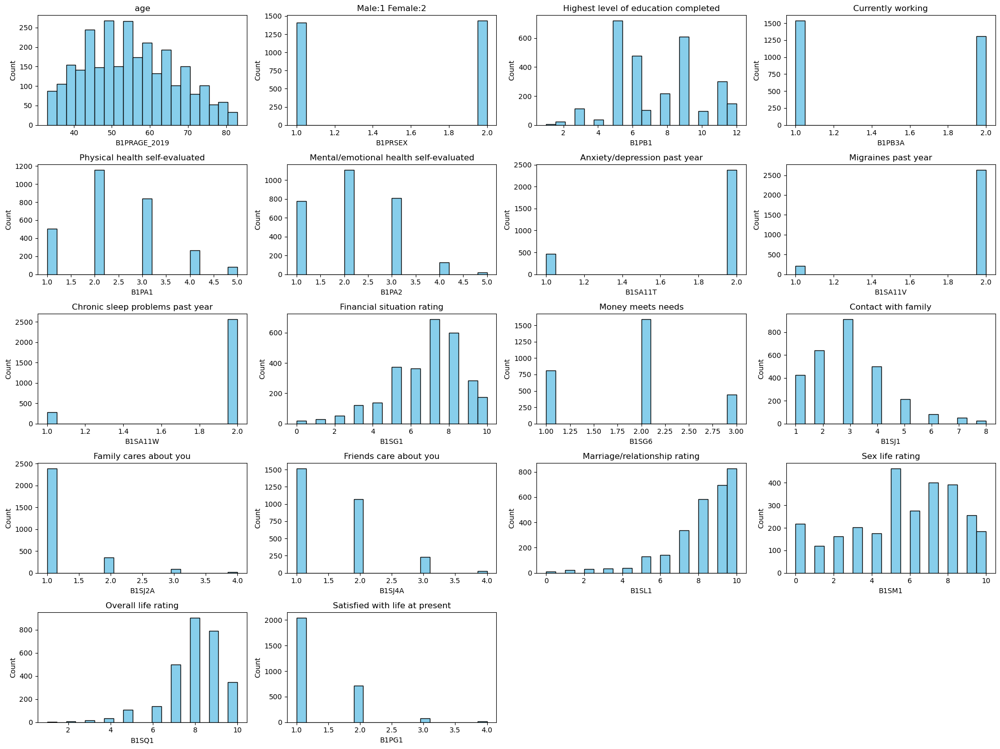

In [22]:
# Plot histograms
num_vars = len(midus_vars)
fig, axes = plt.subplots(nrows=(num_vars + 3) // 4, ncols=4, figsize=(20, 15))
axes = axes.flatten()

for i, var in enumerate(midus_vars):
    axes[i].hist(df[var], bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(f"{midus_vars[var]}")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Count")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [23]:
# Rename columns
df.rename(columns=midus_vars, inplace=True)

# Drop rows with any missing values or codes like -1, -2, 9999
non_response_codes = [-1, -2, -3, -7, 9999]
df_clean = df.copy()

# Replace special missing values with NaN
df_clean.replace(non_response_codes, pd.NA, inplace=True)

# Drop rows with any missing/NA values
df_clean.dropna(inplace=True)

# Exclude ID columns and scale data
features = df_clean.drop(columns=["MIDUS 2 ID number"], errors="ignore")
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Apply UMAP
umap_model = umap.UMAP(n_neighbors=30, min_dist=0.8, metric='euclidean',random_state=23)
embedding = umap_model.fit_transform(scaled_data)

# Create a DataFrame for UMAP output
df_umapo = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2"])
df_umapo = pd.concat([df_umapo, df_clean.reset_index(drop=True)], axis=1)


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


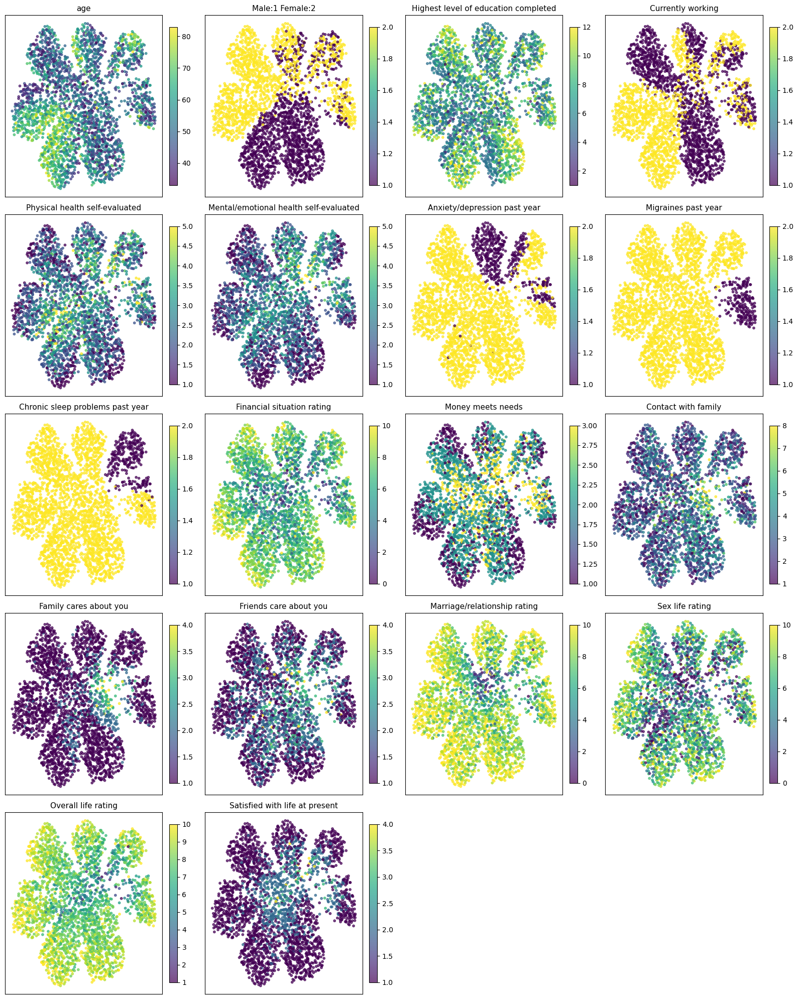

In [25]:
# Number of variables to plot
variables = list(midus_vars.values())  # using renamed columns in df_clean
n_vars = len(variables)

# Define grid size
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# Plot each variable
for i, var in enumerate(variables):
    ax = axes[i]
    scatter = ax.scatter(df_umapo["UMAP1"], df_umapo["UMAP2"], 
                         c=df_umapo[var], cmap='viridis', s=10, alpha=0.7)
    ax.set_title(var, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    #ax.set_xlim([5,15])
    #ax.set_ylim([-1,14])
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('plots/first.png')

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


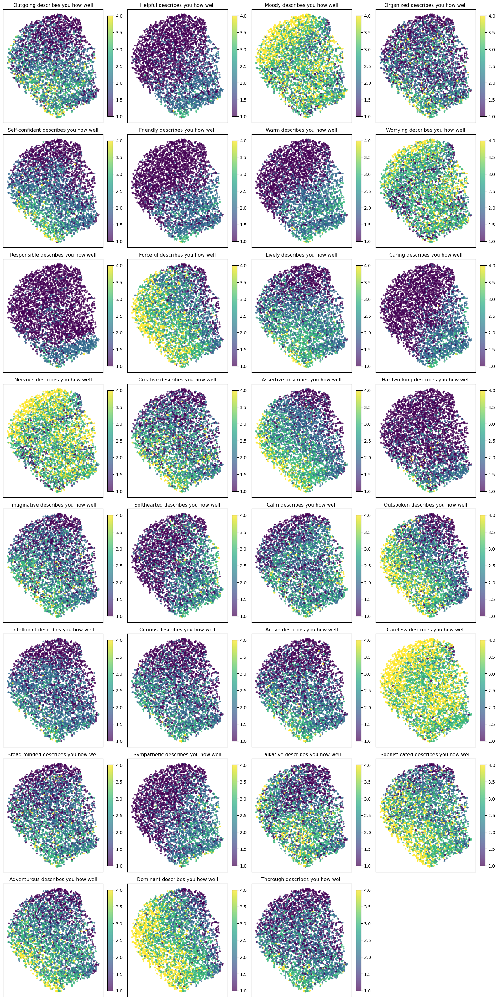

In [34]:
# Dictionary of variable codes and descriptions
personality_vars = {
    "B1SE6A": "Outgoing describes you how well",
    "B1SE6B": "Helpful describes you how well",
    "B1SE6C": "Moody describes you how well",
    "B1SE6D": "Organized describes you how well",
    "B1SE6E": "Self-confident describes you how well",
    "B1SE6F": "Friendly describes you how well",
    "B1SE6G": "Warm describes you how well",
    "B1SE6H": "Worrying describes you how well",
    "B1SE6I": "Responsible describes you how well",
    "B1SE6J": "Forceful describes you how well",
    "B1SE6K": "Lively describes you how well",
    "B1SE6L": "Caring describes you how well",
    "B1SE6M": "Nervous describes you how well",
    "B1SE6N": "Creative describes you how well",
    "B1SE6O": "Assertive describes you how well",
    "B1SE6P": "Hardworking describes you how well",
    "B1SE6Q": "Imaginative describes you how well",
    "B1SE6R": "Softhearted describes you how well",
    "B1SE6S": "Calm describes you how well",
    "B1SE6T": "Outspoken describes you how well",
    "B1SE6U": "Intelligent describes you how well",
    "B1SE6V": "Curious describes you how well",
    "B1SE6W": "Active describes you how well",
    "B1SE6X": "Careless describes you how well",
    "B1SE6Y": "Broad minded describes you how well",
    "B1SE6Z": "Sympathetic describes you how well",
    "B1SE6AA": "Talkative describes you how well",
    "B1SE6BB": "Sophisticated describes you how well",
    "B1SE6CC": "Adventurous describes you how well",
    "B1SE6DD": "Dominant describes you how well",
    "B1SE6EE": "Thorough describes you how well",
}

columns_to_load = list(personality_vars.keys())
df, meta = pyreadstat.read_sav(sav_path, usecols=columns_to_load)
non_response_codes = [-1, -2, -3, -7, 9999]
df.replace(non_response_codes, pd.NA, inplace=True)
df.dropna(inplace=True)
# Rename columns
df.rename(columns=personality_vars, inplace=True)

# Drop rows with any missing values or codes like -1, -2, 9999
non_response_codes = [-1, -2, -3, -7, 9999]
df_clean = df.copy()

# Replace special missing values with NaN
df_clean.replace(non_response_codes, pd.NA, inplace=True)

# Drop rows with any missing/NA values
df_clean.dropna(inplace=True)

# Exclude ID columns and scale data
features = df_clean.drop(columns=["MIDUS 2 ID number"], errors="ignore")
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Apply UMAP
umap_model = umap.UMAP(n_neighbors=30, min_dist=0.3, metric='euclidean',random_state=23)
embedding = umap_model.fit_transform(scaled_data)

# Create a DataFrame for UMAP output
df_umapo = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2"])
df_umapo = pd.concat([df_umapo, df_clean.reset_index(drop=True)], axis=1)

# Number of variables to plot
variables = list(personality_vars.values())  # using renamed columns in df_clean
n_vars = len(variables)

# Define grid size
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# Plot each variable
for i, var in enumerate(variables):
    ax = axes[i]
    scatter = ax.scatter(df_umapo["UMAP1"], df_umapo["UMAP2"], 
                         c=df_umapo[var], cmap='viridis', s=10, alpha=0.7)
    ax.set_title(var, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('plots/second.png')


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


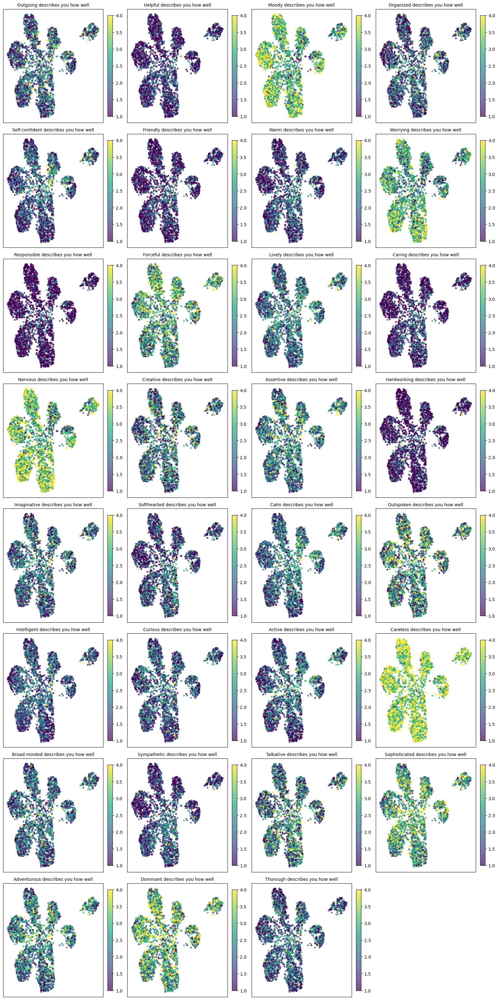

In [35]:
# 1. Load all necessary variables
all_vars = list(midus_vars.keys()) + list(personality_vars.keys())
df, meta = pyreadstat.read_sav(sav_path, usecols=all_vars)

# 2. Clean and separate training and mapping data
non_response_codes = [-1, -2, -3, -7, 9999]
df.replace(non_response_codes, pd.NA, inplace=True)

# Keep original index for later merge
df["orig_index"] = df.index

# Prepare UMAP training data
df_train = df[list(midus_vars.keys()) + ["orig_index"]].dropna().copy()
X_train = df_train.drop(columns=["orig_index"])

# 3. Scale and apply UMAP
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

umap_model = umap.UMAP(n_neighbors=30, min_dist=0.3, metric='euclidean', random_state=23)
embedding = umap_model.fit_transform(X_scaled)

# 4. UMAP DataFrame with index mapping
df_umapo = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2"])
df_umapo["orig_index"] = df_train["orig_index"].values

# 5. Get personality variables for same rows
df_personality = df[["orig_index"] + list(personality_vars.keys())].set_index("orig_index")
df_personality.rename(columns=personality_vars, inplace=True)

# 6. Merge UMAP coordinates with personality values
df_augmented = df_umapo.merge(df_personality, left_on="orig_index", right_index=True, how="left")

# 7. Plot personality variables on UMAP
variables = list(personality_vars.values())
n_vars = len(variables)
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, var in enumerate(variables):
    ax = axes[i]
    scatter = ax.scatter(df_augmented["UMAP1"], df_augmented["UMAP2"],
                         c=df_augmented[var], cmap='viridis', s=10, alpha=0.7)
    ax.set_title(var, fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

# Hide unused plots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('plots/personality_on_midus_umap.png', dpi=150)
